# Covariance exploration

We load the 180 patient covariance matrices and perform data visualization and rund baseline `sklearn` models.

The dataset contains flattened matrices.

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mlp
import matplotlib.pyplot as plt
import tensorflow as tf

In [2]:
import seaborn as sns

In [3]:
df = pd.read_csv('reshaped.csv', header=None)

In [4]:
total_samples, total_features = df.shape

In [26]:
target_index_change = 90

In [110]:
print('Samples: ', total_samples)
print('Features: ', total_features)
print('Index where target feature changes: ', target_index_change)

Samples:  180
Features:  8100
Index where target feature changes:  90


In [5]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,8090,8091,8092,8093,8094,8095,8096,8097,8098,8099
0,1,0.662445,0.330363,0.036282,0.276017,0.178640,0.614524,0.501909,0.346491,0.245726,...,-0.029748,0.242446,0.325585,0.300724,0.552262,0.610168,0.489823,0.587595,0.846914,1
1,1,0.777747,0.421580,0.384655,0.500576,0.188924,0.607248,0.487152,0.446618,0.321734,...,0.539575,0.703622,0.567181,0.683960,0.701690,0.791753,0.428201,0.658840,0.821883,1
2,1,0.647837,0.648584,0.334946,0.441531,0.201681,0.673531,0.463725,0.437799,0.283302,...,0.298544,0.417170,0.459065,0.491652,0.583719,0.644912,0.459540,0.503356,0.750187,1
3,1,0.660829,0.596243,0.110439,0.548808,0.265179,0.803618,0.491285,0.463932,0.387895,...,0.245122,0.500482,0.503216,0.616274,0.276978,0.524008,0.365127,0.521206,0.859120,1
4,1,0.703072,0.287818,0.291988,0.048301,-0.063818,0.459604,0.424963,0.107659,-0.018674,...,0.417374,0.436096,0.439444,0.510504,0.710940,0.727171,0.333142,0.472968,0.750862,1


In [10]:
def reshape_to_matrix(data):
    """
    Reshapes flattend array to NxN matrix.
    """
    size = len(data) ** 0.5  # Dimension of the square matrix.
    assert size % 1 == 0, f'Cannot convert to square matrix. Invalid length of data: {len(data)}.'
    return data.reshape(int(size), int(size))

In [18]:
reshape_to_matrix(df.iloc[0,:].values)

array([[1.        , 0.66244464, 0.33036293, ..., 0.1562867 , 0.56205455,
        0.4291976 ],
       [0.66244464, 1.        , 0.43291723, ..., 0.28361584, 0.68718241,
        0.67175882],
       [0.33036293, 0.43291723, 1.        , ..., 0.51793205, 0.48466784,
        0.62091072],
       ...,
       [0.1562867 , 0.28361584, 0.51793205, ..., 1.        , 0.45928225,
        0.58759492],
       [0.56205455, 0.68718241, 0.48466784, ..., 0.45928225, 1.        ,
        0.84691387],
       [0.4291976 , 0.67175882, 0.62091072, ..., 0.58759492, 0.84691387,
        1.        ]])

In [19]:
def plot_covariances(sample=0):
    """
    Displays heatmap of `sample`th covariance matrix from `df`.
    """
    covariances = df.iloc[sample,:].values
    covariance_matrix = reshape_to_matrix(covariances)
    
    sns.heatmap(covariance_matrix, cmap="YlGnBu")

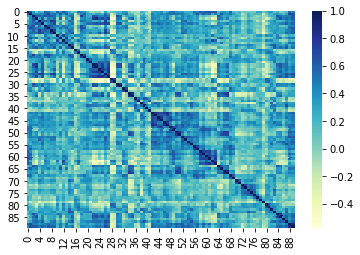

In [20]:
plot_covariances(0)


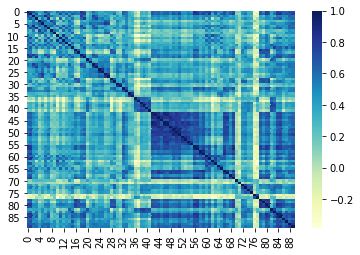

In [21]:
plot_covariances(80)

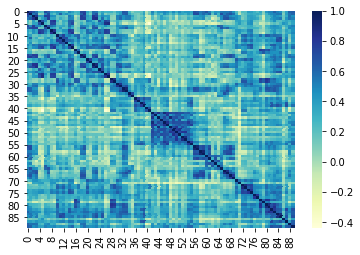

In [22]:
plot_covariances(179)

In [23]:
def plot_variances(start=0, end=-1):
    """
    Plots variance of covariances on samples from `df[start:end]`.
    """
    covariances = df.iloc[start:end,:]
    variances = np.var(covariances).values
    variance_matrix = reshape_to_matrix(variances)
    
    sns.heatmap(variance_matrix, cmap="YlGnBu")
    

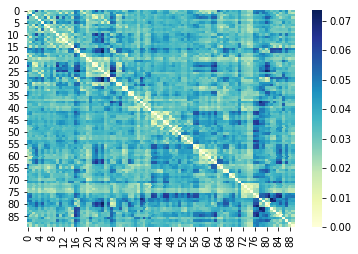

In [24]:
# All samples
plot_variances()

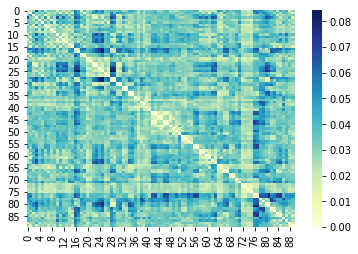

In [27]:
# Healthy subjects
plot_variances(end=target_index_change)

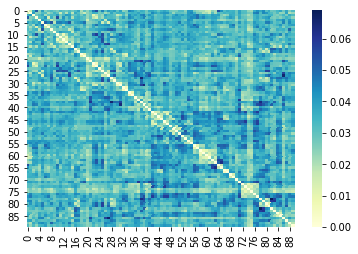

In [28]:
# Patient subjects
plot_variances(start=target_index_change)

## Probe baseline ML models

In [29]:
# All sklearn imports.
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

In [30]:
# Append target class.
df['target'] = 0
df.loc[target_index_change:, 'target'] = 1

In [31]:
# Shuffle data
seed = 42 # Answer to the Ultimate Question of Life, the Universe, and Everything.
df_shuffled = df.sample(frac=1, random_state=seed)

In [32]:
# Train / test splits for cross validation.
# 80 / 20.
X_train, X_test, y_train, y_test = train_test_split(df_shuffled.iloc[:,:total_features], df_shuffled['target'], test_size=0.20, random_state=seed)

print("Train size: ", len(y_train))
print("Test size: ", len(y_test))

Train size:  144
Test size:  36


In [33]:
def confusion_matrix_custom(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    print(f"Correct predictions: {(tp+tn)/(fn+tp+tn+fp):.2f}")
    print(f"TP: {tp}/{fn+tp} ({tp/(fn+tp):.2f})")
    print(f"TN: {tn}/{tn+fp} ({tn/(tn+fp):.2f})")
    print(f"Wrong predictions: {(fp+fn)/(fn+tp+tn+fp):.2f}")
    print(f"FP: {fp}/{tn+fp} ({fp/(tn+fp):.2f})")
    print(f"FN: {fn}/{fn+tp} ({fn/(fn+tp):.2f})")

In [34]:
grid_kwargs = {"cv": 7, "n_jobs": -1}

In [35]:
def cross_validate(estimator, estimator_params, grid_kwargs=grid_kwargs):
    """
    Performs cross-validation using train dataset on estimator.
    Optionally takes grid search settings.
    """
    grid = GridSearchCV(estimator, estimator_params, **grid_kwargs)
    grid.fit(X_train, y_train)
    results = pd.DataFrame(grid.cv_results_)
    y_pred = grid.best_estimator_.predict(X_test)
    confusion_matrix_custom(y_test.values, y_pred)

    print(results.sort_values(by=['rank_test_score']).head(10))

## Baseline Models
- Naive Bayes
- Random Forest
- SVM
- Elastic Net based logistic regression
- Convolutional Net

In [36]:
# Naive Bayes
gnb = GaussianNB()
gnb_params = {"var_smoothing": [1e-10, 1e-9, 1e-8]}
cross_validate(gnb, gnb_params)


Correct predictions: 0.67
TP: 13/18 (0.72)
TN: 11/18 (0.61)
Wrong predictions: 0.33
FP: 7/18 (0.39)
FN: 5/18 (0.28)
   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
0       0.141059      0.010570         0.035285        0.010984   
1       0.116376      0.006038         0.026726        0.005022   
2       0.090085      0.015476         0.021888        0.008364   

  param_var_smoothing                    params  split0_test_score  \
0               1e-10  {'var_smoothing': 1e-10}           0.666667   
1               1e-09  {'var_smoothing': 1e-09}           0.666667   
2               1e-08  {'var_smoothing': 1e-08}           0.666667   

   split1_test_score  split2_test_score  split3_test_score  split4_test_score  \
0           0.571429           0.666667           0.761905               0.75   
1           0.571429           0.666667           0.761905               0.75   
2           0.571429           0.666667           0.761905               0.75   

   split5

In [37]:
# Random forest.
rf = RandomForestClassifier()
rf_params = {"max_depth": [1,2,3,5], "criterion": ("entropy", "gini")}
cross_validate(rf, rf_params)

Correct predictions: 0.64
TP: 11/18 (0.61)
TN: 12/18 (0.67)
Wrong predictions: 0.36
FP: 6/18 (0.33)
FN: 7/18 (0.39)
   mean_fit_time  std_fit_time  mean_score_time  std_score_time  \
7       0.533940      0.041365         0.022601        0.008365   
5       0.416058      0.015394         0.029596        0.004152   
3       0.853199      0.039231         0.031230        0.005281   
6       0.487679      0.012048         0.032031        0.011205   
1       0.676850      0.065142         0.029711        0.006238   
2       0.757382      0.064193         0.033933        0.009291   
4       0.335842      0.016635         0.029250        0.006153   
0       0.430040      0.007713         0.058382        0.016004   

  param_criterion param_max_depth                                    params  \
7            gini               5     {'criterion': 'gini', 'max_depth': 5}   
5            gini               2     {'criterion': 'gini', 'max_depth': 2}   
3         entropy               5  {'criter

In [38]:
# SVC.
svc = SVC()
svc_params = {"C": [1, 10, 100], "kernel": ("poly", "rbf", "sigmoid"), "degree": [2,3]}
cross_validate(svc, svc_params)

Correct predictions: 0.81
TP: 14/18 (0.78)
TN: 15/18 (0.83)
Wrong predictions: 0.19
FP: 3/18 (0.17)
FN: 4/18 (0.22)
    mean_fit_time  std_fit_time  mean_score_time  std_score_time param_C  \
13       0.452286      0.044645         0.096980        0.027618     100   
7        0.508244      0.055664         0.082576        0.008623      10   
16       0.503519      0.096541         0.093639        0.019651     100   
10       0.491777      0.065472         0.085044        0.007718      10   
15       0.488053      0.070937         0.087293        0.029761     100   
9        0.469966      0.054846         0.079032        0.012333      10   
12       0.445038      0.027132         0.074409        0.016083     100   
6        0.459120      0.029239         0.088898        0.022953      10   
3        0.456919      0.049274         0.066812        0.013466       1   
0        0.435243      0.011706         0.078314        0.016973       1   

   param_degree param_kernel                   

In [39]:
# Elastic Net.
eln = SGDClassifier()
eln_params = {"loss": ["log"], "alpha": [0.1, 0.01, 0.001], "penalty": ["elasticnet"], "l1_ratio": [0.15, 0.25, 0.5, 0.7]}
cross_validate(eln, eln_params)

Correct predictions: 0.81
TP: 12/18 (0.67)
TN: 17/18 (0.94)
Wrong predictions: 0.19
FP: 1/18 (0.06)
FN: 6/18 (0.33)
    mean_fit_time  std_fit_time  mean_score_time  std_score_time param_alpha  \
7        0.283526      0.031011         0.017133        0.006633        0.01   
5        0.481926      0.114993         0.014653        0.005113        0.01   
8        0.374633      0.032263         0.019693        0.003795       0.001   
9        0.367209      0.025846         0.017690        0.001697       0.001   
6        0.330750      0.024129         0.013057        0.005563        0.01   
11       0.312539      0.037039         0.012668        0.004052       0.001   
4        0.486892      0.120001         0.018766        0.003372        0.01   
10       0.343436      0.039251         0.017237        0.006651       0.001   
0        0.326744      0.055239         0.017296        0.003690         0.1   
1        0.225104      0.058708         0.018382        0.006341         0.1   

   

## Convolutional net on covariance matrices

In [41]:
# Train / dev / test splits for standard approach.
# 70 / 15 / 15.
X_train_dev, X_test, y_train_dev, y_test = train_test_split(df_shuffled.iloc[:,:total_features], df_shuffled['target'], test_size=0.15, random_state=seed)
X_train, X_dev, y_train, y_dev = train_test_split(X_train_dev, y_train_dev, test_size=0.17, random_state=seed)

print("Train size: ", len(y_train))
print("Dev size: ", len(y_dev))
print("Test size: ", len(y_test))

Train size:  126
Dev size:  27
Test size:  27


In [45]:
conv_train = X_train.values.reshape(-1, 90,90,1)
conv_dev = X_dev.values.reshape(-1, 90,90,1)
conv_test = X_test.values.reshape(-1, 90,90,1)

In [50]:
# Convolutional neural network.
inputs = tf.keras.layers.Input(shape=[90, 90, 1])
hidden = tf.keras.layers.Conv2D(2, 3, 1, "same", activation=tf.nn.relu)(inputs)
hidden = tf.keras.layers.Conv2D(2, 3, 1, "same", activation=tf.nn.relu)(inputs)
hidden = tf.keras.layers.MaxPool2D(2)(hidden)

hidden = tf.keras.layers.Flatten()(hidden)
hidden = tf.keras.layers.Dense(units=8, activation=tf.nn.relu)(hidden)
outputs = tf.keras.layers.Dense(units=1, activation=tf.nn.sigmoid)(hidden)

model = tf.keras.Model(inputs=inputs, outputs=outputs)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss=tf.keras.losses.BinaryCrossentropy(),
    metrics=[tf.keras.metrics.BinaryAccuracy()],
)
model.fit(x=conv_train, y=y_train, epochs=500, validation_data=(conv_dev, y_dev))

Epoch 1/500
4/4 [==============================] - 1s 136ms/step - loss: 0.6982 - binary_accuracy: 0.5032 - val_loss: 0.6882 - val_binary_accuracy: 0.4074
Epoch 2/500
4/4 [==============================] - 0s 125ms/step - loss: 0.6813 - binary_accuracy: 0.5324 - val_loss: 0.6825 - val_binary_accuracy: 0.5926
Epoch 3/500
4/4 [==============================] - 0s 52ms/step - loss: 0.6743 - binary_accuracy: 0.5137 - val_loss: 0.6753 - val_binary_accuracy: 0.6296
Epoch 4/500
4/4 [==============================] - 0s 47ms/step - loss: 0.6703 - binary_accuracy: 0.6384 - val_loss: 0.6701 - val_binary_accuracy: 0.5556
Epoch 5/500
4/4 [==============================] - 0s 53ms/step - loss: 0.6640 - binary_accuracy: 0.6594 - val_loss: 0.6657 - val_binary_accuracy: 0.6296
Epoch 6/500
4/4 [==============================] - 0s 54ms/step - loss: 0.6532 - binary_accuracy: 0.7001 - val_loss: 0.6595 - val_binary_accuracy: 0.6296
Epoch 7/500
4/4 [==============================] - 0s 48ms/step - loss: 0.

Github: david-hartman